## Import Libraries

In [2]:
%matplotlib notebook
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as td
import torchvision as tv
from PIL import Image
import matplotlib.pyplot as plt
import nntools as nt
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cpu


In [4]:
dataset_root_dir =  'BSDS300/images/'

## Define DataLoader

In [ ]:
class NoisyBSDSDataset(td.Dataset):
    def __init__(self, root_dir, mode='train', image_size=(180, 180), sigma=30):
        super(NoisyBSDSDataset, self).__init__()
        self.mode = mode
        self.image_size = image_size
        self.sigma = sigma
        self.images_dir = os.path.join(root_dir, mode)
        self.files = os.listdir(self.images_dir)

    def __len__(self):
        return len(self.files)

    def __repr__(self):
        return "NoisyBSDSDataset(mode={}, image_size={}, sigma={})". \
        format(self.mode, self.image_size, self.sigma)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.files[idx])
        clean = Image.open(img_path).convert('RGB')
        i = np.random.randint(clean.size[0] - self.image_size[0])
        j = np.random.randint(clean.size[1] - self.image_size[1])
        # COMPLETE
        clean = clean.crop([i, j, i+self.image_size[0], j+self.image_size[1]]) #random crop of size 180x180
        transform = tv.transforms.Compose([
            tv.transforms.ToTensor(), #converts PIL image in the range(0,255) to ndarray in the range(0.0,1.0)
            tv.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5), inplace=True) #normalise between -1 and 1
        ])
        clean = transform(clean) #apply all the transformations described above

        noisy = clean + 2 / 255 * self.sigma * torch.randn(clean.shape)
        return noisy, clean

    

train_set = NoisyBSDSDataset(root_dir=dataset_root_dir, mode='train', image_size=(180,180))
test_set = NoisyBSDSDataset(root_dir=dataset_root_dir, mode='test', image_size=(320,320))

## Plotting and Image Functions

In [6]:
def myimshow(image, ax=plt):
    image = image.to('cpu').numpy()
    image = np.moveaxis(image, [0, 1, 2], [2, 0, 1])
    image = (image + 1) / 2
    image[image < 0] = 0
    image[image > 1] = 1
    h = ax.imshow(image)
    ax.axis('off')
    return h

In [14]:
def plot(exp, fig, axes, noisy, visu_rate=2):
    if exp.epoch % visu_rate != 0:
        return
    with torch.no_grad():
        denoised = exp.net(noisy[np.newaxis].to(exp.net.device))[0]
    axes[0][0].clear()
    axes[0][1].clear()
    axes[1][0].clear()
    axes[1][1].clear()
    myimshow(noisy, ax=axes[0][0])
    axes[0][0].set_title('Noisy image')
    # COMPLETE
    myimshow(denoised, ax=axes[0][1])
    axes[0][1].set_title('Denoised image')
    axes[1][0].plot([exp.history[k][0]['loss'] for k in range(exp.epoch)], label="training loss")
    axes[1][0].set_title('training loss')
    axes[1][1].plot([exp.history[k][0]['psnr'] for k in range(exp.epoch)], label="psnr")
    axes[1][1].set_title('psnr')    
    
    plt.tight_layout()
    fig.canvas.draw()

In [20]:
def showImage(idx):
    noisy,clean = test_set[idx] #if we call test_set again, we will get a different crop
    with torch.no_grad():
        denoised = exp11.net(noisy[np.newaxis].to(exp11.net.device))[0]


    fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(7,6), sharex='all', sharey='all')
    axes[0][0].set_title("Noisy")
    myimshow(noisy, axes[0][0])
    axes[1][0].set_title("Denoised")
    myimshow(denoised, axes[1][0])
    axes[0][1].set_title("Clean")
    myimshow(clean, axes[0][1])

As our model will be fully convolutional, we can afford to use different sized dimensions for training and testing.

<IPython.core.display.Javascript object>


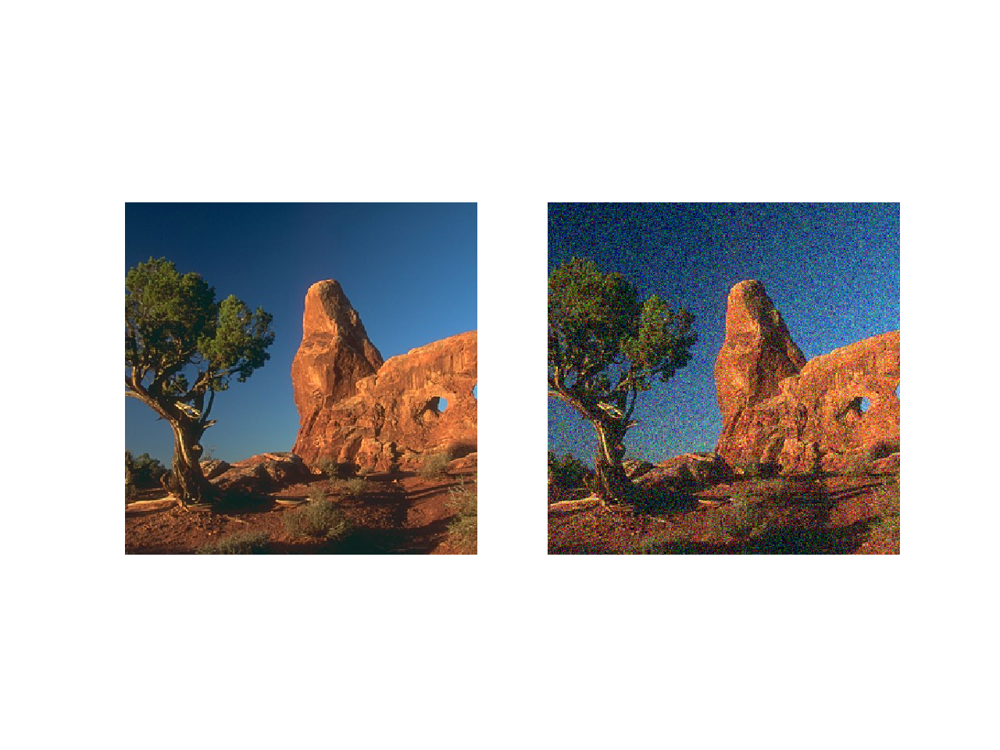

In [9]:
x = test_set[14]
fig, (ax1,ax2) = plt.subplots(ncols=2)
myimshow(x[1], ax=ax1)
myimshow(x[0], ax=ax2)

-------------
-------------

# DnCNN
-------------

## Model

In [10]:
import nntools as nt

class NNRegressor(nt.NeuralNetwork):
    def __init__(self):
        super(NNRegressor, self).__init__()
        self.loss = nn.MSELoss()
    def criterion(self, y, d):
        return self.loss(y, d)

In [ ]:
class DnCNN(NNRegressor):
    
    def __init__(self, D, C=64):
        super(DnCNN, self).__init__()
        self.D = D
        self.conv = nn.ModuleList()
        self.conv.append(nn.Conv2d(3, C, 3, padding=(1,1)))
        # COMPLETE
        for i in range(D):
            self.conv.append(nn.Conv2d(C, C, 3, padding=(1,1)))
        self.conv.append(nn.Conv2d(C, 3, 3, padding=(1,1)))
        
        self.bn = nn.ModuleList()
        for k in range(D):
            self.bn.append(nn.BatchNorm2d(C))
            
    def forward(self, x):
        D = self.D
        h = F.relu(self.conv[0](x))
        # COMPLETE
        for i in range(1,D+1):
            h = F.relu(self.bn[i-1](self.conv[i](h)))
        y = self.conv[D+1](h) + x
        return y

As the filter size is 3 and stride is 1, zaro-padding by 1 pixel in all directions will result in the image of same dimension (size will decrease by filter_size-1 = 2 in breadth and height after convolution without padding).

**nn.ModuleList :** It is basically a list of modules that help keep your code clean and short. ModuleList can be indexed like a regular Python list, but modules it contains are properly registered, and will be visible by all Module methods. We can also append, extend and insert into these lists.

**nn.BatchNorm2d :** It calculates the mean and variance in each dimension over the mini-batches. It also has 2 learnable parameters, which are introduced to preserve the network capacity. This layer mostly helps speed up the convergence process by keeping a similar distribution after backprop so that the layers don't have to adapt to it every iteration. 

## Stat Manager

In [12]:
class DenoisingStatsManager(nt.StatsManager):
    
    def __init__(self):
        super(DenoisingStatsManager, self).__init__()
        
    def init(self):
        super(DenoisingStatsManager, self).init()
        self.running_psnr = 0
        self.count = 0
        
    def accumulate(self, loss, x, y, d):
        super(DenoisingStatsManager, self).accumulate(loss, x, y, d)
        mse = y-d
        mse = mse*mse
        mse = torch.sum(mse).float()
        self.running_psnr += 10 * torch.log10((4*y.numel()) / mse)
        self.count += 1
        
    def summarize(self):
        loss = super(DenoisingStatsManager, self).summarize()
        psnr = self.running_psnr / self.count   
        return {'loss': loss, 'psnr': psnr}

**PSNR :** is peak signal to noise ratio which we will use here to measure progress, instead of accuracy. The formula for calculating psnr is given in the question. We calculate n (no. of elements of tensor) using .numel() command. 

## Experiment 1

In [13]:
lr = 1e-3
net = DnCNN(D=6)
net = net.to(device)
adam = torch.optim.Adam(net.parameters(), lr=lr)
stats_manager = DenoisingStatsManager()
exp11 = nt.Experiment(net, train_set, test_set, adam, stats_manager, batch_size = 4,
                     output_dir="denoising11", perform_validation_during_training=True)

<IPython.core.display.Javascript object>


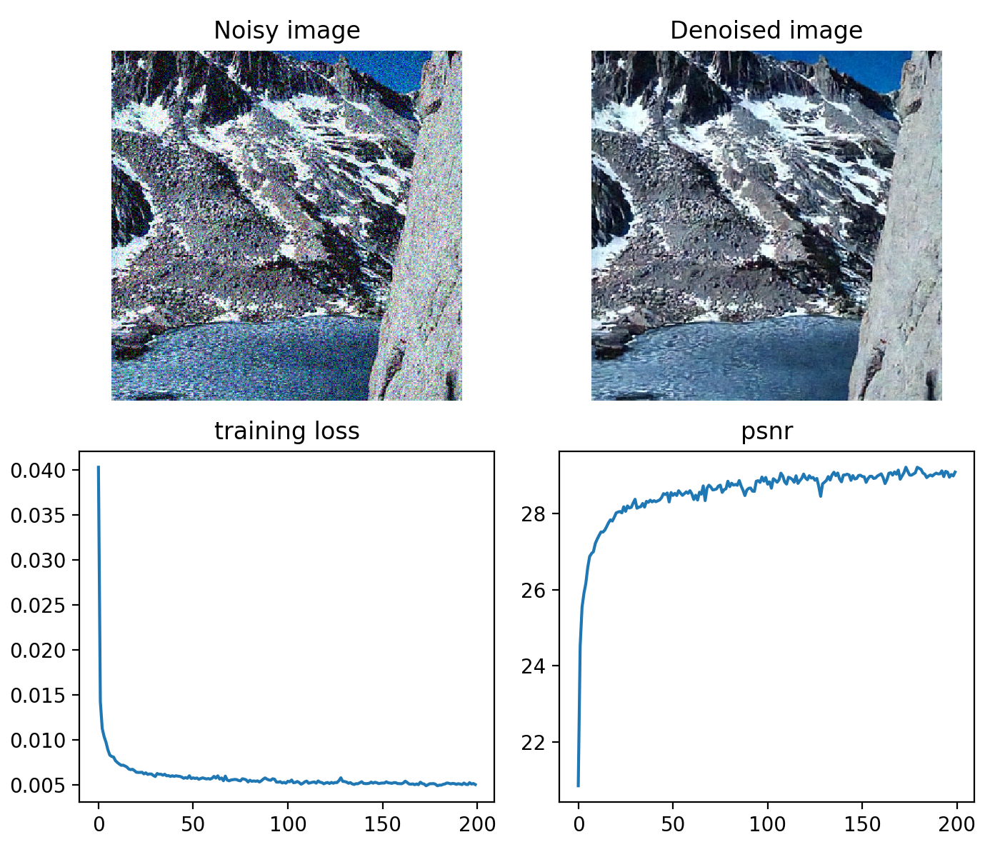

Start/Continue training from epoch 200
Finish training for 200 epochs


In [15]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(7,6))
exp11.run(num_epochs=200, plot=lambda exp: plot(exp, fig=fig, axes=axes, noisy=test_set[73][0]))

<IPython.core.display.Javascript object>


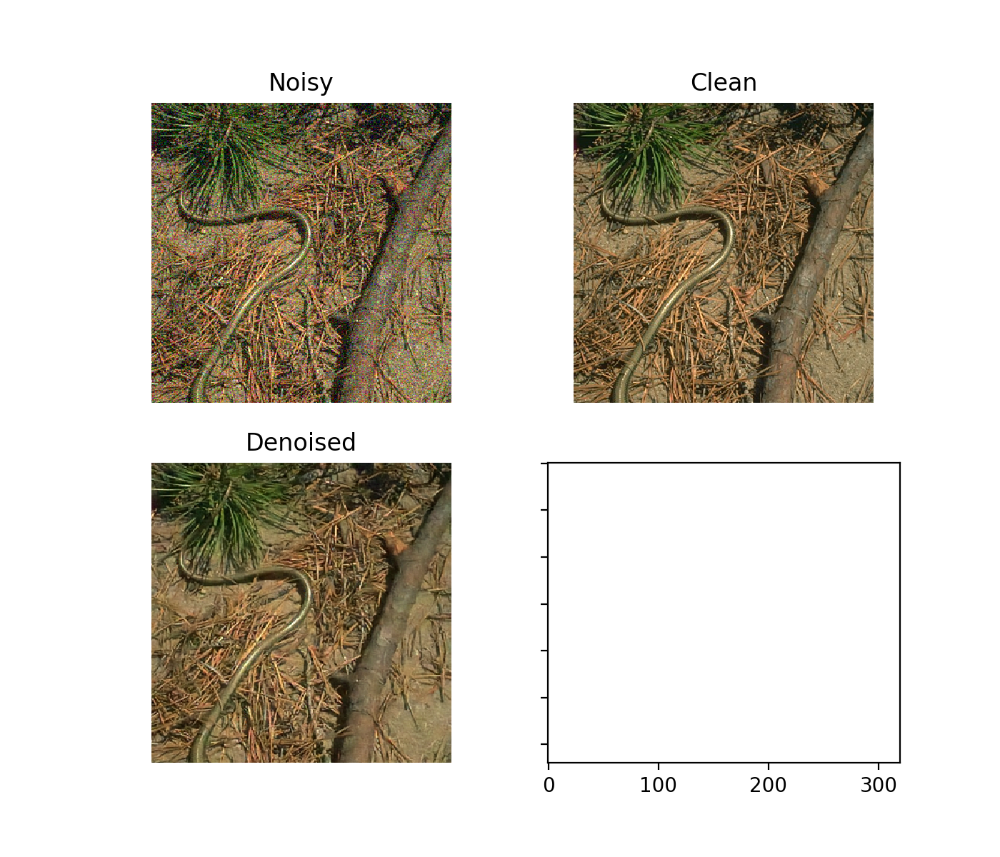

In [22]:
showImage(15)

There is a minor loss of information, for example, in the details (wrinkles) of the tree log above. Also some of the small sticks lying around are missing/very light colored. 

<IPython.core.display.Javascript object>


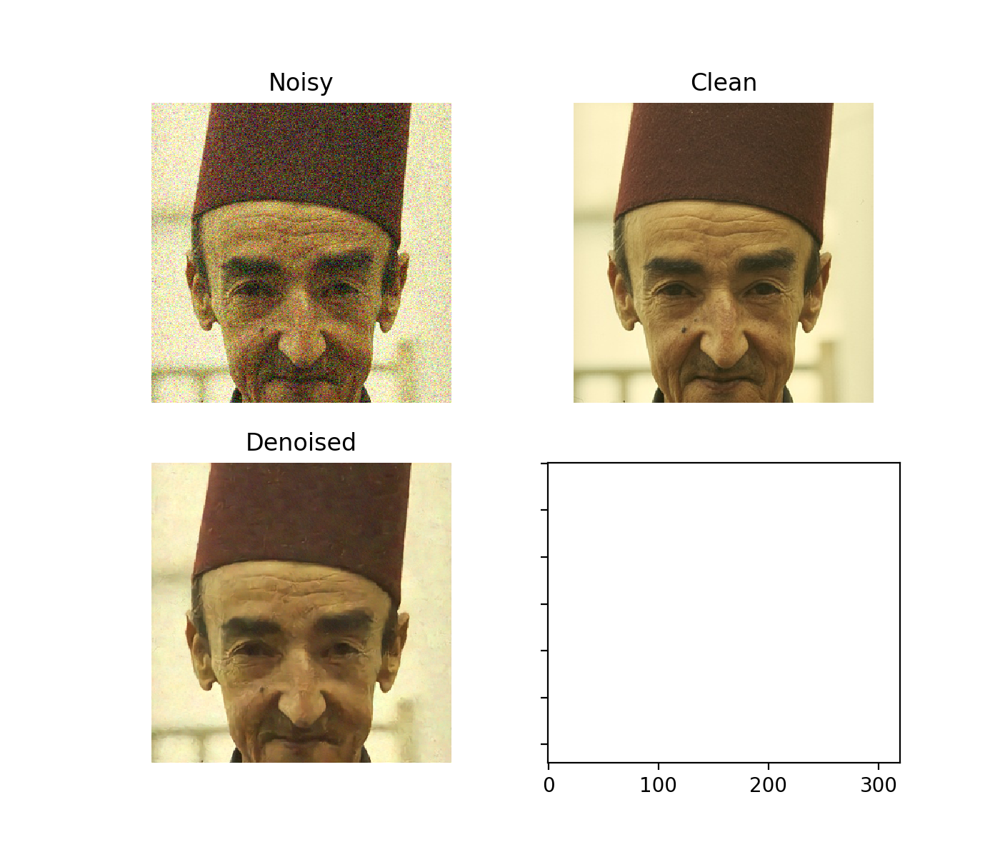

In [14]:
showImage(35)

Here we can see that our model make the whole eyes black. And the background is still noisy(altough a bit smoothed). 

<IPython.core.display.Javascript object>


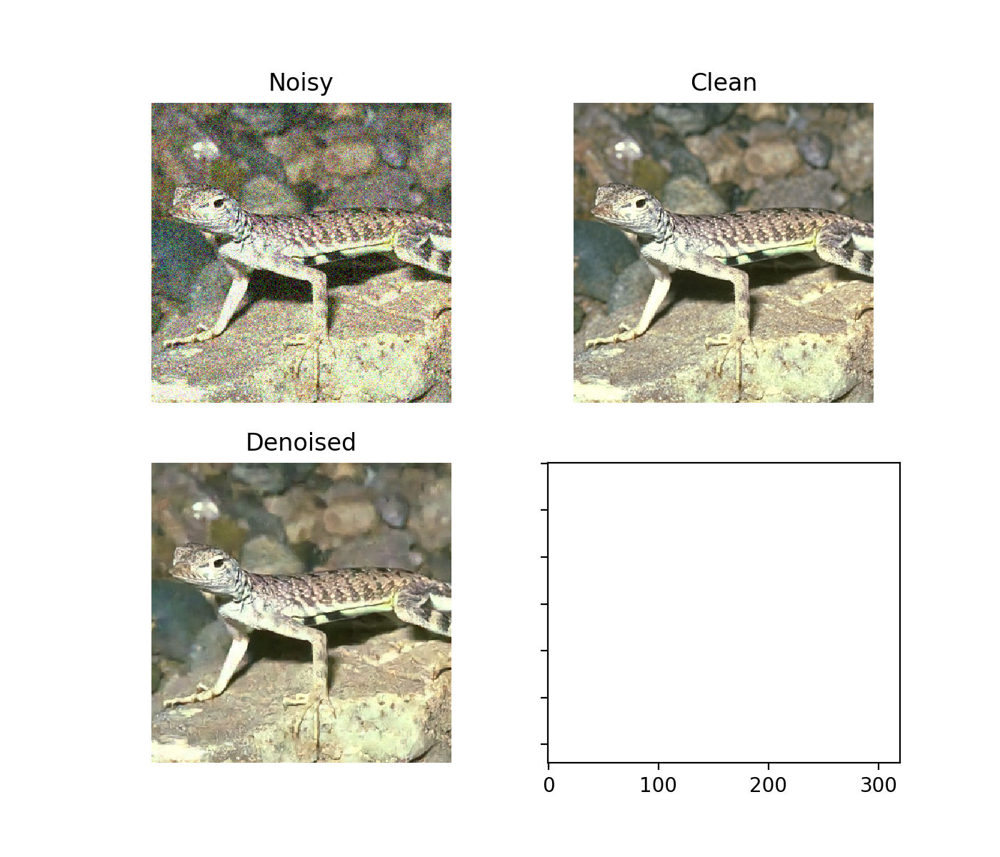

In [26]:
showImage(3)

The model has performed well in reconstructing the noisy image. It is almost indistinguishable from the original except for the granular details in the rocks. The denoised image shows smoothened surface whereas in reality the surface is quite textured. 

## Parameters and Receptive Field

For each layer we calculate parameters using the formula: (C_in * kernal_height * kernel_width + 1) * C_out

In [48]:
D=6

first_layer = ((3*3*3) + 1) * 64     #layer1*layer2*kernel_size + bias
common_layers = ((64*3*3) + 1) * 64 * D
last_layer = ((64*3*3) + 1) * 3

batchnorm_layers = 64*D*2 #2 variables for each channel, for each layer
total = first_layer + common_layers + last_layer + batchnorm_layers
print("total parameters : ", total)

total parameters :  225859


In [49]:
net = DnCNN(D=6)
sum(p.numel() for p in net.parameters()) == total

True

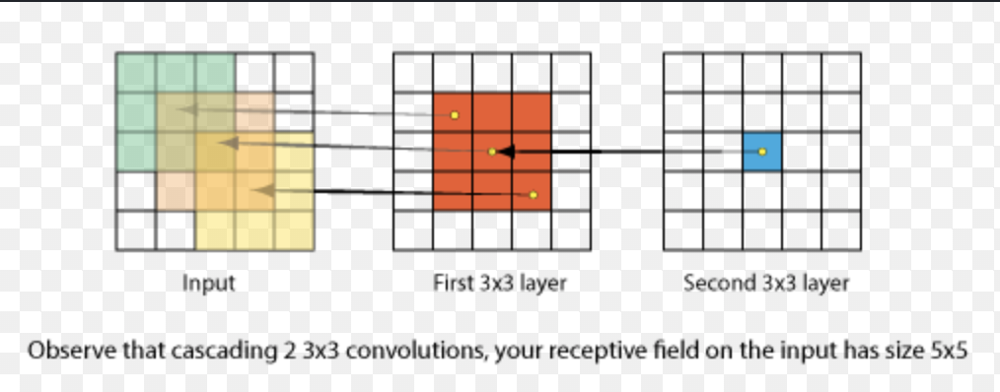

In [16]:
from IPython.display import Image as Image1
Image1("conv.png",width=600,height=600)

In this case each pixel is affected by 3 pixels from last layer as the size of filter is 3x3. Now every pixel of that 3x3 would be affected by 5x5 patch from previous layer (see figure above). Thus for every conv layer we would add a receptive field of kernel_size - 1 to both dimensions (here it will be 2). Since we have 8 conv layers, the final receptive field will be **17x17** (3+2+2+2+2+2+2+2). 

In terms of D it can be written as 1 + 2 + 2*D + 2 = 5 + 2*D

To get a receptive field of 33x33, we will need to have 16 conv layers in the model, which is double the layers we have right now. This will lead to double the number of layers -> double the parameters. And to train double the parameters we will need double the computation time. 

# U-net like CNNs

## Model

In [52]:
class UDnCNN(NNRegressor):
    
    def __init__(self, D, C=64):
        super(UDnCNN, self).__init__()
        self.D = D
        self.conv = nn.ModuleList()
        self.conv.append(nn.Conv2d(3, C, 3, padding=(1,1)))
        # COMPLETE
        for i in range(D):
            self.conv.append(nn.Conv2d(C, C, 3, padding=(1,1)))
        self.conv.append(nn.Conv2d(C, 3, 3, padding=(1,1)))
        
        self.bn = nn.ModuleList()
        for i in range(D):
            self.bn.append(nn.BatchNorm2d(C))
            
        self.pool_indices = []
        for i in range(D):
            if i < D/2 - 1:
                self.pool_indices.append(i)
            elif i > D/2:
                self.pool_indices.append(i)
            
    def forward(self, x):
        sizes = []
        indices = []
        features = []
        
        D = self.D
        h = F.relu(self.conv[0](x))
        features.append(h)
        
        for i in range(D):
            if i in self.pool_indices and i < D/2 - 1:
                sizes.append(h.size())
                h,idx = F.max_pool2d(F.relu(self.bn[i](self.conv[i+1](h))), kernel_size=2, return_indices=True)
                features.append(h)
                indices.append(idx)
        
            elif i in self.pool_indices and i > D/2:
                last_size = sizes.pop()
                last_feature = features.pop()
                h += last_feature
                h /= 2**0.5
                idx = indices.pop()
                h = F.max_unpool2d(F.relu(self.bn[i](self.conv[i+1](h))), output_size=last_size, kernel_size=2, indices = idx)
            else:
                h = F.relu(self.bn[i](self.conv[i+1](h)))
        
        last_feature = features.pop()
        h += last_feature
        h /= 2**0.5
        
        y = self.conv[D+1](h) + x
        return y

## Experiment 2

In [53]:
lr = 1e-3
net = UDnCNN(D=6)
net = net.to(device)
adam = torch.optim.Adam(net.parameters(), lr=lr)
stats_manager = DenoisingStatsManager()
exp21 = nt.Experiment(net, train_set, test_set, adam, stats_manager, batch_size = 4,
                     output_dir="denoising21", perform_validation_during_training=True)

<IPython.core.display.Javascript object>


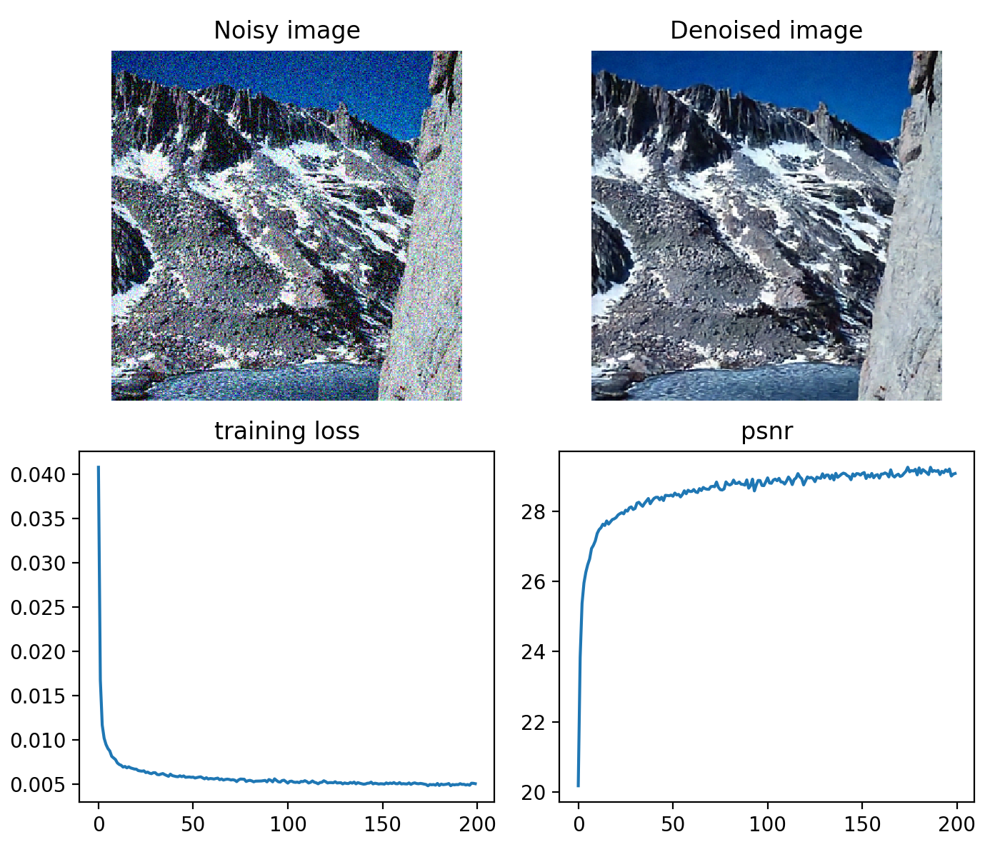

Start/Continue training from epoch 200
Finish training for 200 epochs


In [54]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(7,6))
exp21.run(num_epochs=200, plot=lambda exp: plot(exp, fig=fig, axes=axes, noisy=test_set[73][0]))

## Parameters and Receptive Field

The number of parameters will be same as DnCNN because the max pool and unpool layers have no parameters and other layers are still having the same parameters. 

In [55]:
D=6

first_layer = ((3*3*3) + 1) * 64     #layer1*layer2*kernel_size + bias
common_layers = ((64*3*3) + 1) * 64 * D
last_layer = ((64*3*3) + 1) * 3

batchnorm_layers = 64*D*2 #2 variables for each channel, for each layer
total = first_layer + common_layers + last_layer + batchnorm_layers
print("total parameters : ", total)

total parameters :  225859


In [56]:
net = UDnCNN(D=6)
total == sum(p.numel() for p in net.parameters())

True


We find that the receptive field of UDnCNN is 33x33 (using the formula given on piazza *The receptive field next increases after each convolution by 2\**(k−l) + 1 times the number you need to pad to preserve spatial resolution. Here k and l are respectively the number of maxpooling and unpooling placed before that convolution.*)

receptive field after each layer (seperated by + sign) : 1+2+2+4+8+8+4+2+2

Yes, I expect UDnCNN to beat DnCNN as the receptive field of U network is quite higher than DnCNN (and also equal to the required receptive field of 33 as mentioned in the assignment for noise of std 30). 

## Comparison between CNN and U-Net

In [59]:
eval1 = exp11.evaluate()
eval2 = exp21.evaluate()

print("loss of DnCNN : {} \t\t\t loss of UDnCNN : {}\n".format(eval1["loss"],eval2["loss"]))

print("PSNR of DnCNN : {} \t\t\t PSNR of UDnCNN : {}\n"
      .format(eval1["psnr"].cpu().numpy(),eval2["psnr"].cpu().numpy()))



loss of DnCNN : 0.0054040422476828096 			 loss of UDnCNN : 0.005338134858757258

PSNR of DnCNN : 28.776649475097656 			 PSNR of UDnCNN : 28.852296829223633



As expected, UDnCNN performs slightly better than DnCNN. I have observed that this changes every time we run a new experiment, indicating that it is dependent on many conditions like initialisations. But theoretically speaking, UDnCNN should perform better than DnCNN considering the larger receptive field in case of UDnCNN.

# U-net like CNNs with dilated convolutions

## Model

In [62]:
class DUDnCNN(NNRegressor):
    
    def __init__(self, D, C=64):
        super(DUDnCNN, self).__init__()
        self.D = D
        self.conv = nn.ModuleList()
        self.conv.append(nn.Conv2d(3, C, 3, padding=(1,1)))
        # COMPLETE
        dilation = 1
        for i in range(D):
            if i<D/2 and i!=0:
                dilation *= 2
            if i>D/2:
                dilation //= 2
            
            self.conv.append(nn.Conv2d(C, C, 3, padding=(dilation,dilation), dilation=(dilation,dilation)))

        self.conv.append(nn.Conv2d(C, 3, 3, padding=(1,1)))
        
        self.bn = nn.ModuleList()
        for i in range(D):
            self.bn.append(nn.BatchNorm2d(C))

            
    def forward(self, x):
        D = self.D
        h = F.relu(self.conv[0](x))
        features.append(h)
        sizes = []
        indices = []
        features = []
        
        for i in range(D):
            if i < D/2 - 1:
                sizes.append(h.size())
                torch.backends.cudnn.benchmark=True
                h = self.conv[i+1](h)
                torch.backends.cudnn.benchmark=False
                h = F.relu(self.bn[i](h))
                features.append(h)
        
            elif i > D/2:
                last_size = sizes.pop()
                last_feature = features.pop()
                h += last_feature
                h /= 2**0.5
                torch.backends.cudnn.benchmark=True
                h = self.conv[i+1](h)
                torch.backends.cudnn.benchmark=False
                h = F.relu(self.bn[i](h))
            else:
                torch.backends.cudnn.benchmark=True
                h = self.conv[i+1](h)
                torch.backends.cudnn.benchmark=False
                h = F.relu(self.bn[i](h))
        
        last_feature = features.pop()
        h += last_feature
        h /= 2**0.5
        
        y = self.conv[D+1](h) + x
        return y

We need to pad according to dilation factor in order to keep the size same. As dilation increases, we'll need to adject padding accordingly (which will be equal to dilation factor).

We use torch.backends.cudnn.benchmark=True to increase the speed of our model. This basically tells PyTorch to try all the algorithms for the particular configuration of input and select whichever works the fastest. Since our input remains same throughout training, it only runs this once and selects the best algorithm and uses that for rest of the training time. It might change when we're testing though, as now the size of our input changes. 

## Experiment 3

In [63]:
lr = 1e-3
net = DUDnCNN(D=6)
net = net.to(device)
adam = torch.optim.Adam(net.parameters(), lr=lr)
stats_manager = DenoisingStatsManager()
exp31 = nt.Experiment(net, train_set, test_set, adam, stats_manager, batch_size = 4,
                     output_dir="denoising31", perform_validation_during_training=True)

<IPython.core.display.Javascript object>


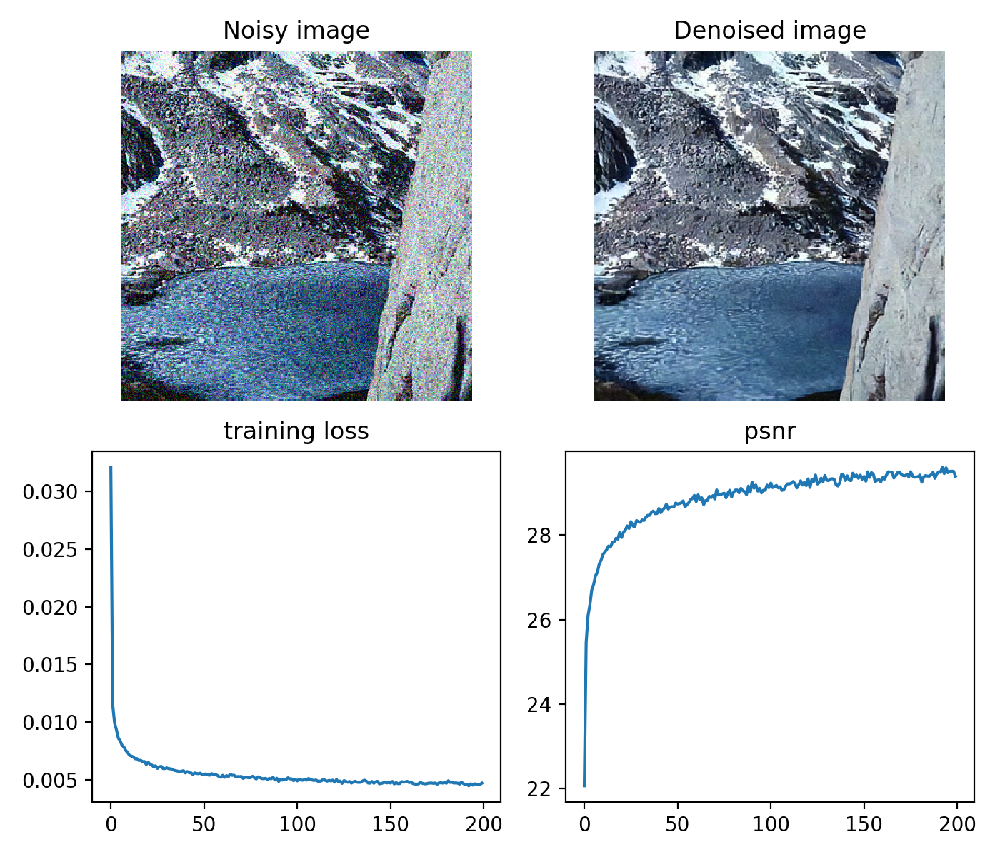

Start/Continue training from epoch 200
Finish training for 200 epochs


In [64]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(7,6))
exp31.run(num_epochs=200, plot=lambda exp: plot(exp, fig=fig, axes=axes, noisy=test_set[73][0]))

## Parameters and Receptive Field

This model will again have the same parameters as the DnCNN because we still have the same parameters in the kernel, we're just including gaps in between. And all other things remain same as DnCNN.

In [67]:
D=6

first_layer = ((3*3*3) + 1) * 64     #layer1*layer2*kernel_size + bias
common_layers = ((64*3*3) + 1) * 64 * D
last_layer = ((64*3*3) + 1) * 3

batchnorm_layers = 64*D*2 #2 variables for each channel, for each layer
total = first_layer + common_layers + last_layer + batchnorm_layers
print("total parameters : ", total)

total parameters :  225859


In [68]:
net = DUDnCNN(D=6)
sum(p.numel() for p in net.parameters()) == total

True

To find the receptive field of dilated network, we'll use the fact that dilated kernel can be assumed to be a kernel of size 2\*d + 1 where d is the dilation rate. And for each layer, the increase in receptive field will be kernel_size - 1 (except for last layer). So effectively the increase in receptive layer will be 2\*d.

Dilation rate for first layer = 1
Dilation rates for first half (except first layer) : 1, 2, 4
Dilation rates for first half (except last layer) : 4, 2, 1
Dilation rate for last layer = 1

Layer wise increase of receptive field : 
1 + 2 + 2 + 4 + 8 + 8 + 4 + 2 + 2 = 33

Total receptive field will be 33x33 for DUDnCNN. 

## Comparison of all 3 methods

In [65]:
eval1 = exp11.evaluate()
eval2 = exp21.evaluate()
eval3 = exp31.evaluate()


print("loss of DnCNN : {} \nloss of UDnCNN : {} \nloss of DUDnCNN : {} \n".format(eval1["loss"],eval2["loss"],eval3["loss"]))

print("PSNR of DnCNN : {} \nPSNR of UDnCNN : {}\nPSNR of DUDnCNN : {}\n"
      .format(eval1["psnr"].cpu().numpy(),eval2["psnr"].cpu().numpy(),eval3["psnr"].cpu().numpy()))

loss of DnCNN : 0.005438329875469208 
loss of UDnCNN : 0.005336853703483939 
loss of DUDnCNN : 0.005047269444912672 

PSNR of DnCNN : 28.74845314025879 
PSNR of UDnCNN : 28.848600387573242
PSNR of DUDnCNN : 29.090253829956055



In [66]:
def showImageFromAllNets(idx):
    noisy,clean = test_set[idx] #if we call test_set again, we will get a different crop
    with torch.no_grad():
        dncnn = exp11.net(noisy[np.newaxis].to(exp11.net.device))[0]
        udncnn = exp21.net(noisy[np.newaxis].to(exp21.net.device))[0]
        dudncnn = exp31.net(noisy[np.newaxis].to(exp31.net.device))[0]


    fig, axes = plt.subplots(ncols=3, nrows=1, figsize=(10,6), sharex='all', sharey='all')
    axes[0].set_title("DnCNN")
    myimshow(dncnn, axes[0])
    axes[1].set_title("UDnCNN")
    myimshow(udncnn, axes[1])
    axes[2].set_title("DUDnCNN")
    myimshow(dudncnn, axes[2])

<IPython.core.display.Javascript object>


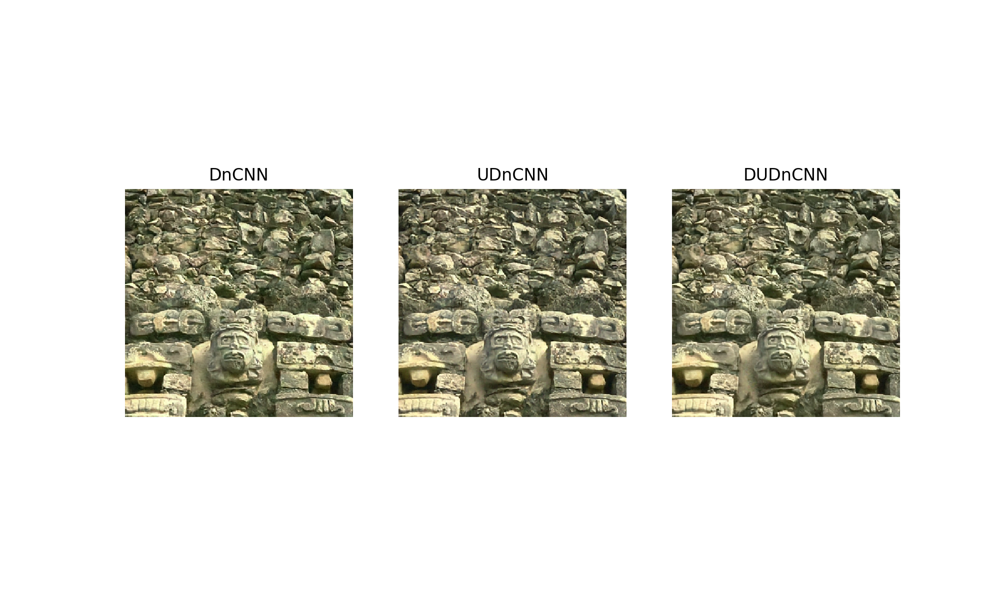

<IPython.core.display.Javascript object>


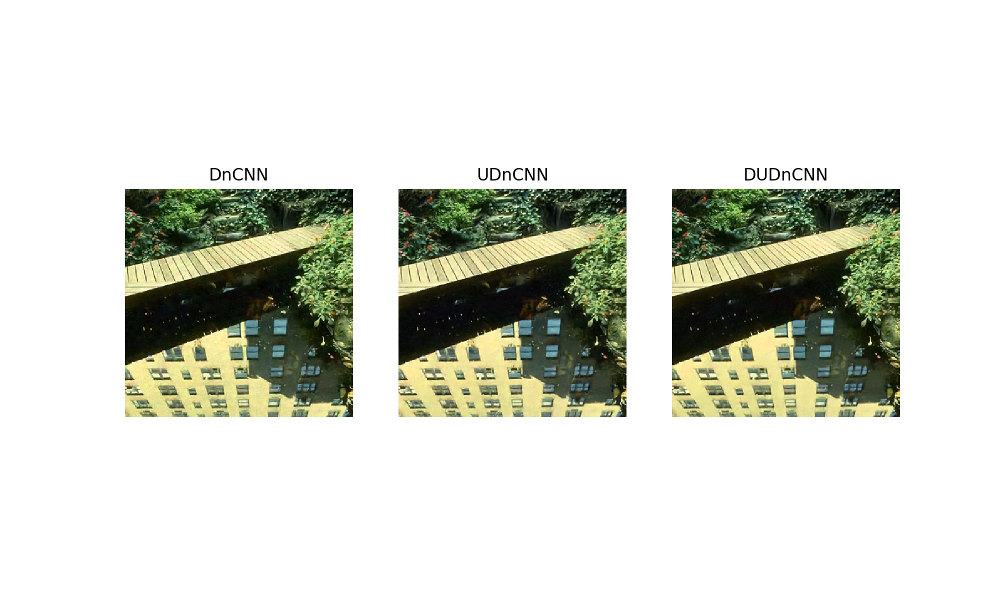

<IPython.core.display.Javascript object>


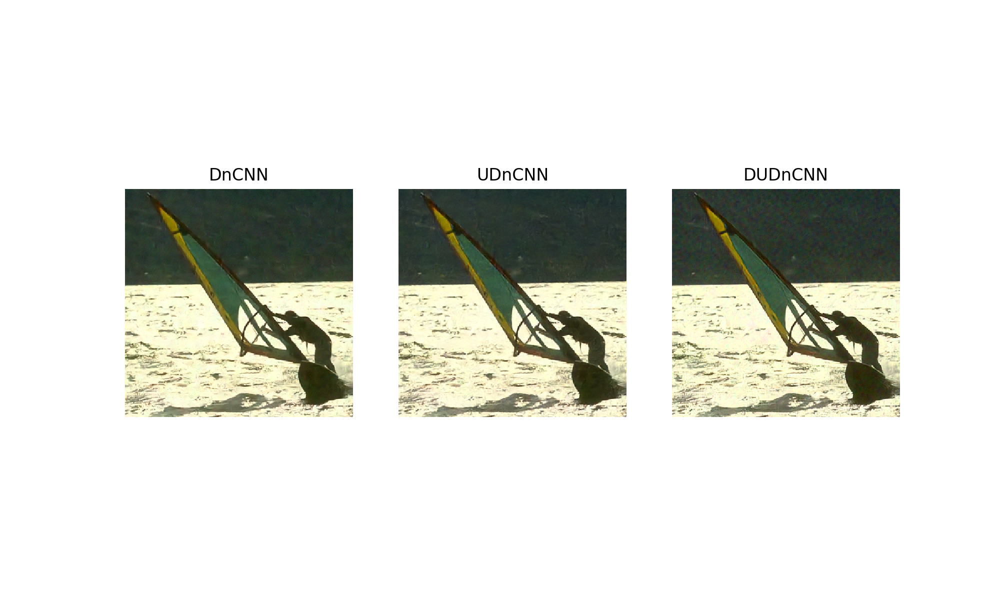

<IPython.core.display.Javascript object>


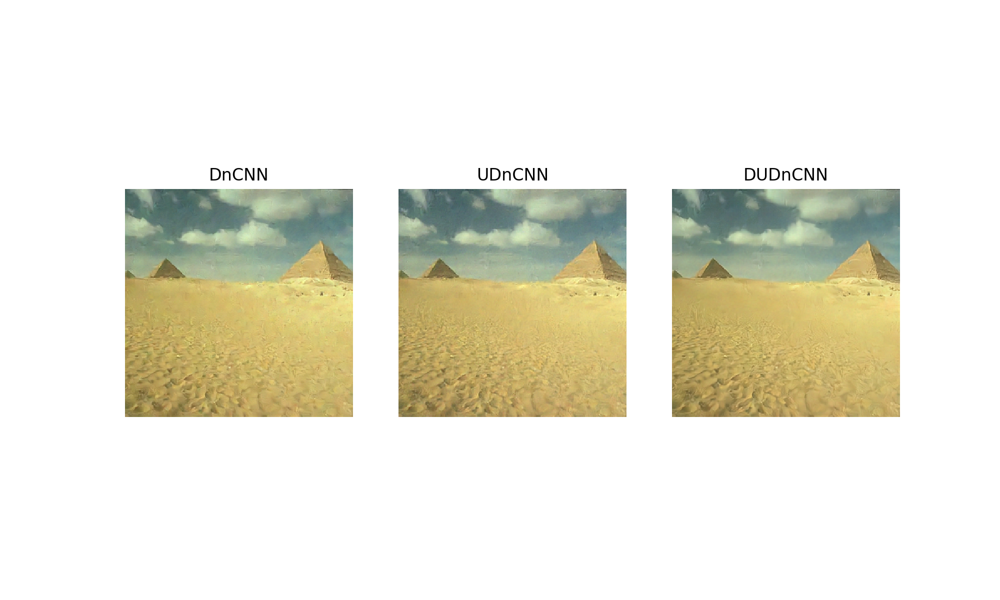

In [57]:
showImageFromAllNets(1)
showImageFromAllNets(2)
showImageFromAllNets(5)
showImageFromAllNets(7)

## Conclusion 

We observe that DUDnCNN performs similar to UDnCNN, both of which perform better than DnCNN. The receptive field of DUDnCNN is equal to UDnCNN, and thus they perform similarly. But the receptive field of DnCNN is quite less than these two (due to lack of pooling/dilation), and thus performs somewhat poorly. 

We can also see that DnCNN is more computationally expensive as compared to other two networks because it keep convoluting on the image of the same size with the filter of same size for each network. Thus the advantage of U net and dilation network is two fold. It computes faster and delivers better results owing to higher receptive field.

The performance of U-net and dilated network is still debatable as both of them have the same receptive field. 